## Data Description 
This data was extracted from the census bureau database found at
https://www.census.gov/data.html
Donor: Terran Lane and Ronny Kohavi
        Data Mining and Visualization
        Silicon Graphics.
        e-mail: terran@ecn.purdue.edu, ronnyk@sgi.com for questions.

 The data was split into train/test in approximately 2/3, 1/3
 proportions using MineSet's MIndUtil mineset-to-mlc.

 Prediction task is to determine the income level for the person
represented by the record.  Incomes have been binned at the $50K
 level to present a binary classification problem, much like the
 original UCI/ADULT database.  The goal field of this data, however,
 was drawn from the "total person income" field rather than the
 "adjusted gross income" and may, therefore, behave differently than the
 original ADULT goal field.

In [64]:
##### Install the packages required to run this code

In [ ]:
!pip install pandas
!pip install numpy
!pip install matplotlib
!pip install seaborn
!pip install scipy
!pip install scikit-learn
!pip install pandas-profiling

In [1]:
import pandas as pd
import numpy as np

In [2]:
############################## Data Understanding #############################################################

In [3]:
train = pd.read_csv("census_income_learn.csv",names=['0', '1', '2','3','4','5','6','7','8','9','10','11',
                                                     '12','13','14','15','16','17','18','19','20','21','22','23','24','25','26'
                                                    ,'27','28','29','30','31','32','33','34','35','36','37','38','39','40','41'])

In [4]:
train.head(2)

,0,1,2,3,4,5,6,7,8,9,...,32,33,34,35,36,37,38,39,40,41
0,73,Not in universe,0,0,High school graduate,0,Not in universe,Widowed,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,0,95,- 50000.
1,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.


The column name is not present based on the meta data provided create the column name

In [65]:
############### Data Understanding and EDA Analysis ###############################################

__Pandas Profiling__ library helps us carry fast and automatic EDA on our dataset with minimal lines of code.

In [5]:
from pandas_profiling import ProfileReport

SystemError: initialization of _internal failed without raising an exception

In [22]:
report = ProfileReport(train)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Understanding Pandas Profiling Results

## Overview
The overview section contains three tabs: Overview, Warnings and Reproduction.

The Overview tab provides statistical information about your dataset including the __number of variables__ (columns in the dataframe), __number of observations__ (total number of rows), how many values are missing along with the percentage, how many duplicates there are, and the file size.

The __Alerts__ tab is used to inform you about any issues with each of the columns within your data, such as correlation between variables, data skewness, data distribution

## Variables
Within the variables section of the report we can view the detailed statistics of each of the columns contained within the dataframe. This includes how many missing values there are, the statistics of the data (mean, minimum and maximum), and more.

On the right hand side of each section, we can see a histogram of the data distribution. This gives us an indication of the skewness of the data, as well as it’s spread.

## Interactions
The interactions section of the report allows you to plot one variable against another in order to understand how they relate to each other.

## Correlations
The correlations section allows us to understand the degree at which two variables are correlated with one another. Within the pandas_profile report, we can view different methods of correlation:

* Spearman’s ρ
* Pearson’s r
* Kendall’s τ
* Phik (φk)
If you are unsure what each method is, you can click on the button “Toggle Correlation Descriptions” and it will provide details of the meaning of each method.

## Missing Values
We can also gain a good understanding of how complete our dataset is. This is similar to the functionality provided by the missingno Python library.

We can view the data using 4 types of plot:

* The count plot provides a count of the total values present.
* The matrix plot gives an indication of where the missing values are within the dataframe.
* The heatmap plot gives us an indication of how the null values correlate between variables.
* The dendrogram is a tree like graph, which shows how much null values are correlated between the variables. Groups that are closer together indicate a strong correlation in nullity.

## Sample
Finally, the sample section allows us to view the raw numbers of the dataset for the first 10 rows and last 10 rows. This is the equivalent of running df.head(10) and df.tail(10).

# Understanding the Train Dataset

## Overview

* __No of rows__ : 199523
* __No of columns__ : 41
* __No of missing rows__ :0
* __No of duplicate rows__ :2766

In given dataset we can see from the pandas profiling we can see two datatype available 
* __No categorical variable__ : 31
* __No of numerical variable__ : 10

## Alerts

Important alerts of the census dataset

* 21 has a high cardinality: 51 distinct values.
* 0 is highly correlated with 1,2,3,4,6,7,8,9,19,22,23,30,31,38,39.
* 18 is highly skewed (γ1 = 27.78650179)
* 0 has 2839 (1.4%) zeros

__Note__ : High-cardinality refers to columns with values that have unique values.

From the above visualization we can see the column data that is present and with the meta data provided we can give the column name that is given in the meta data

In [6]:
# The data has year 1994 and 1995
year=[94,95]

In [7]:
# Function for identifying the list values that is present in the column and changes the column name
def new_name(col,list_of_value,new_col,df):
    if df[col].isin(list_of_value).any()==True :
        return new_col
    else:
        return col
    

In [8]:
rename=new_name(col='40',list_of_value=year,new_col='year',df=train)

In [9]:
train = train.rename(columns={'40':rename,'0':'age','41':'y'})

The column number 41 holds the income category of each person since this column is the prediction column we are naming it has 'y'

In [10]:
train.head(3)

,age,1,2,3,4,5,6,7,8,9,...,32,33,34,35,36,37,38,39,year,y
0,73,Not in universe,0,0,High school graduate,0,Not in universe,Widowed,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,0,95,- 50000.
1,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.
2,18,Not in universe,0,0,10th grade,0,High school,Never married,Not in universe or children,Not in universe,...,Vietnam,Vietnam,Vietnam,Foreign born- Not a citizen of U S,0,Not in universe,2,0,95,- 50000.


In [11]:
train = train.rename(columns={'12':'sex','11':'hispanic_origin','10':'race','9':'major_occupation_code',
                              '8':'major_industry_code','7':'marital_stat',
                              '4':'education','1':'class_of_worker','6':'enroll_in_edu_inst_last_wk'
                             ,'13':'member_of_a_labor_union',
                              '14':'reason_for_unemployment','15':'full_part_time_employment_stat',
                             '19':'tax_filer_stat','20':'region_of_previous_residence','21':'state_of_previous_residence',
                              '22':'detailed_household_family_stat','23':'detailed_household_summary_household',
                              '25':'migration_code_change_msa',
                              '26':'migration_code_change_reg','27':'migration_code_move_within_reg'
                             ,'28':'live_this_house_year_ago','29':'migration_prev_res_sunbelt','31':'family_members_under_18',
                             '32':'country_of_birth_father','33':'country_of_birth_mother','34':'country_of_birth_self',
                             '35':'citizenship','36':'own_business_self_employed','37':'fill_inc_questionnaire_for_veteran_admin'
                             ,'38':'veterans_benefits'})

In [12]:
train = train.rename(columns={'39':'week_worked_year','2':'detailed_industry_recode','3':'detailed_occupation_recode',
                              '5':'wage_per_hour',
                              '16':'capital_gains','17':'capital losses',
                              '18':'dividends_from_stocks','24':'instance_weight','30':'num_persons_worked_for_employer'
                             })

In [15]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199523 entries, 0 to 199522
Data columns (total 42 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   age                                       199523 non-null  int64  
 1   class_of_worker                           199523 non-null  object 
 2   detailed_industry_recode                  199523 non-null  int64  
 3   detailed_occupation_recode                199523 non-null  int64  
 4   education                                 199523 non-null  object 
 5   wage_per_hour                             199523 non-null  int64  
 6   enroll_in_edu_inst_last_wk                199523 non-null  object 
 7   marital_stat                              199523 non-null  object 
 8   major_industry_code                       199523 non-null  object 
 9   major_occupation_code                     199523 non-null  object 
 10  race                

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt


ImportError: cannot import name 'cbook' from partially initialized module 'matplotlib' (most likely due to a circular import) (C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\matplotlib\__init__.py)

In [13]:
train.describe()

,age,detailed_industry_recode,detailed_occupation_recode,wage_per_hour,capital_gains,capital losses,dividends_from_stocks,instance_weight,num_persons_worked_for_employer,own_business_self_employed,veterans_benefits,week_worked_year,year
count,199523.000000,199523.000000,199523.000000,199523.000000,199523.00000,199523.000000,199523.000000,199523.000000,199523.000000,199523.000000,199523.000000,199523.000000,199523.000000
mean,34.494199,15.352320,11.306556,55.426908,434.71899,37.313788,197.529533,1740.380269,1.956180,0.175438,1.514833,23.174897,94.499672
std,22.310895,18.067129,14.454204,274.896454,4697.53128,271.896428,1984.163658,993.768156,2.365126,0.553694,0.851473,24.411488,0.500001
min,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,37.870000,0.000000,0.000000,0.000000,0.000000,94.000000
25%,15.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1061.615000,0.000000,0.000000,2.000000,0.000000,94.000000
50%,33.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1618.310000,1.000000,0.000000,2.000000,8.000000,94.000000
75%,50.000000,33.000000,26.000000,0.000000,0.00000,0.000000,0.000000,2188.610000,4.000000,0.000000,2.000000,52.000000,95.000000
max,90.000000,51.000000,46.000000,9999.000000,99999.00000,4608.000000,99999.000000,18656.300000,6.000000,2.000000,2.000000,52.000000,95.000000


In [14]:
train.isna().sum() / train.shape[0] * 100

age                                         0.0
class_of_worker                             0.0
detailed_industry_recode                    0.0
detailed_occupation_recode                  0.0
education                                   0.0
wage_per_hour                               0.0
enroll_in_edu_inst_last_wk                  0.0
marital_stat                                0.0
major_industry_code                         0.0
major_occupation_code                       0.0
race                                        0.0
hispanic_origin                             0.0
sex                                         0.0
member_of_a_labor_union                     0.0
reason_for_unemployment                     0.0
full_part_time_employment_stat              0.0
capital_gains                               0.0
capital losses                              0.0
dividends_from_stocks                       0.0
tax_filer_stat                              0.0
region_of_previous_residence            

As per above output we can see there is no null value .But when we visualize the data some categorical column has __' ?'__ which
has no meaning .So we have to see the percentage of __'?'__ that is present in the data.

In [15]:
null=train['migration_code_change_msa'][0]

In [16]:
null

' ?'

In [17]:
train[train == null] = np.nan

In [18]:
train.isna().sum() / train.shape[0] * 100

age                                          0.000000
class_of_worker                              0.000000
detailed_industry_recode                     0.000000
detailed_occupation_recode                   0.000000
education                                    0.000000
wage_per_hour                                0.000000
enroll_in_edu_inst_last_wk                   0.000000
marital_stat                                 0.000000
major_industry_code                          0.000000
major_occupation_code                        0.000000
race                                         0.000000
hispanic_origin                              0.000000
sex                                          0.000000
member_of_a_labor_union                      0.000000
reason_for_unemployment                      0.000000
full_part_time_employment_stat               0.000000
capital_gains                                0.000000
capital losses                               0.000000
dividends_from_stocks       

From the above output we can see some columns has __'?'__ values.
* migration_code_change_msa = 50 %
* migration_code_change_reg = 50 %
* migration_code_move_within_reg = 50 %
* migration_prev_res_sunbelt = 50 %
 The other column has less than 5% of __'?'__ values

In [19]:
# We write the columns with missing data in a list.
ctgrs = ["state_of_previous_residence","migration_code_change_msa","migration_code_change_reg","migration_code_move_within_reg"
        ,"migration_prev_res_sunbelt","country_of_birth_father","country_of_birth_mother","country_of_birth_self"]

# We fill these missing values with the for loop

for x in ctgrs:
    train[x].fillna(train[x].mode()[0], inplace=True)

## Univariate Variable Analysis

__Categorical Variables:__'class_of_worker', 'education',  'enroll_in_edu_inst_last_wk', 'marital_stat', 'major_industry_code',
       'major_occupation_code', 'race', 'hispanic_origin', 'sex','member_of_a_labor_union', 'reason_for_unemployment',
       'full_part_time_employment_stat','tax_filer_stat',  'region_of_previous_residence', 'state_of_previous_residence',
       'detailed_household_family_stat', 'detailed_household_summary_household', 'migration_code_change_msa',    'migration_code_change_reg',
       'migration_code_move_within_reg', 'live_this_house_year_ago',
       'migration_prev_res_sunbelt','family_members_under_18', 'country_of_birth_father',
       'country_of_birth_mother', 'country_of_birth_self', 'citizenship',
       'fill_inc_questionnaire_for_veteran_admin', 'y'
       
       
__Continuous Variables:__ 'age','detailed_industry_recode','detailed_occupation_recode','wage_per_hour','veterans_benefits',
       'week_worked_year','wage_per_hour','capital_gains', 'capital losses',
       'dividends_from_stocks','instance_weight','num_persons_worked_for_employer','own_business_self_employed','year'

In [20]:
def bar_plot(variable):
    # we get the features
    var = train[variable]
    # count number of categorical variable
    varValue = var.value_counts()
    
    plt.figure(figsize = (9,3))
    plt.bar(varValue.index, varValue)
    plt.xticks(varValue.index, varValue.index.values)
    plt.ylabel("Frequency")
    plt.title(variable)
    plt.show()
    print("{}: \n {}".format(variable,varValue))
     

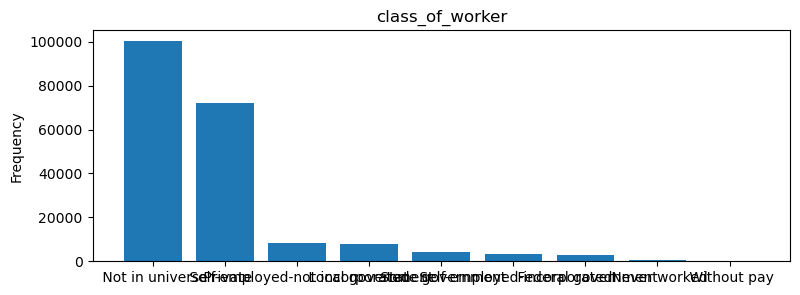

class_of_worker: 
  Not in universe                   100245
 Private                            72028
 Self-employed-not incorporated      8445
 Local government                    7784
 State government                    4227
 Self-employed-incorporated          3265
 Federal government                  2925
 Never worked                         439
 Without pay                          165
Name: class_of_worker, dtype: int64


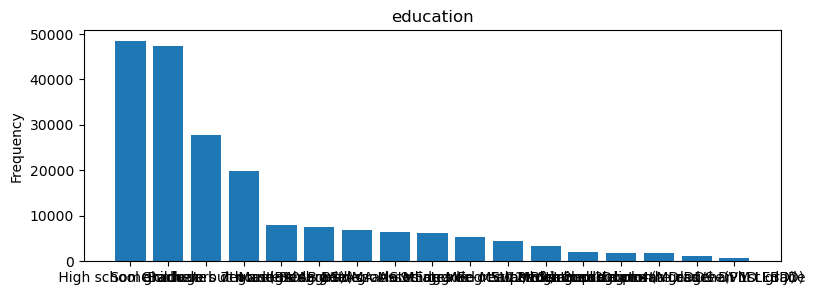

education: 
  High school graduate                      48407
 Children                                  47422
 Some college but no degree                27820
 Bachelors degree(BA AB BS)                19865
 7th and 8th grade                          8007
 10th grade                                 7557
 11th grade                                 6876
 Masters degree(MA MS MEng MEd MSW MBA)     6541
 9th grade                                  6230
 Associates degree-occup /vocational        5358
 Associates degree-academic program         4363
 5th or 6th grade                           3277
 12th grade no diploma                      2126
 1st 2nd 3rd or 4th grade                   1799
 Prof school degree (MD DDS DVM LLB JD)     1793
 Doctorate degree(PhD EdD)                  1263
 Less than 1st grade                         819
Name: education, dtype: int64


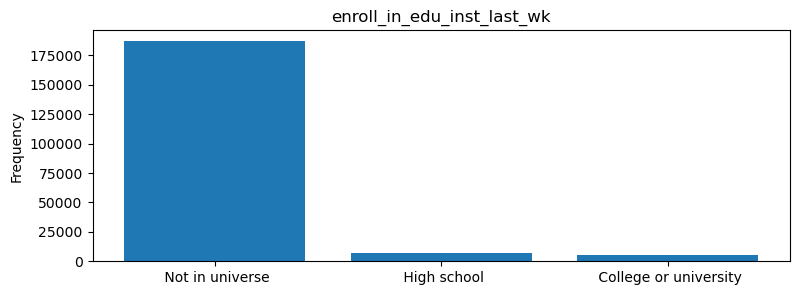

enroll_in_edu_inst_last_wk: 
  Not in universe          186943
 High school                6892
 College or university      5688
Name: enroll_in_edu_inst_last_wk, dtype: int64


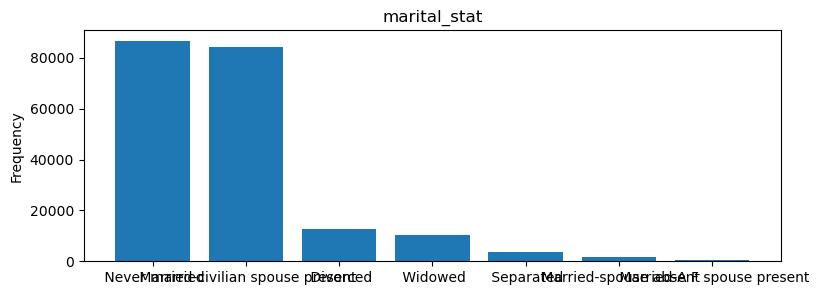

marital_stat: 
  Never married                      86485
 Married-civilian spouse present    84222
 Divorced                           12710
 Widowed                            10463
 Separated                           3460
 Married-spouse absent               1518
 Married-A F spouse present           665
Name: marital_stat, dtype: int64


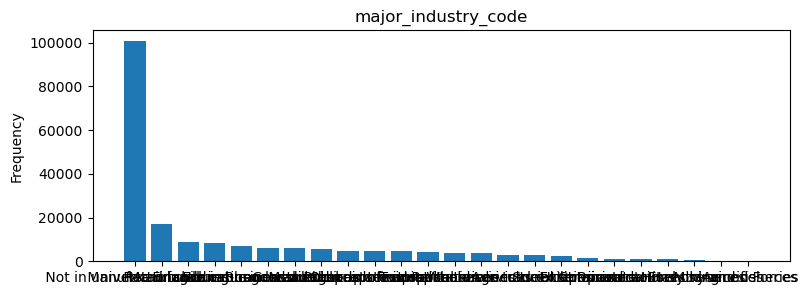

major_industry_code: 
  Not in universe or children            100684
 Retail trade                            17070
 Manufacturing-durable goods              9015
 Education                                8283
 Manufacturing-nondurable goods           6897
 Finance insurance and real estate        6145
 Construction                             5984
 Business and repair services             5651
 Medical except hospital                  4683
 Public administration                    4610
 Other professional services              4482
 Transportation                           4209
 Hospital services                        3964
 Wholesale trade                          3596
 Agriculture                              3023
 Personal services except private HH      2937
 Social services                          2549
 Entertainment                            1651
 Communications                           1181
 Utilities and sanitary services          1178
 Private household services          

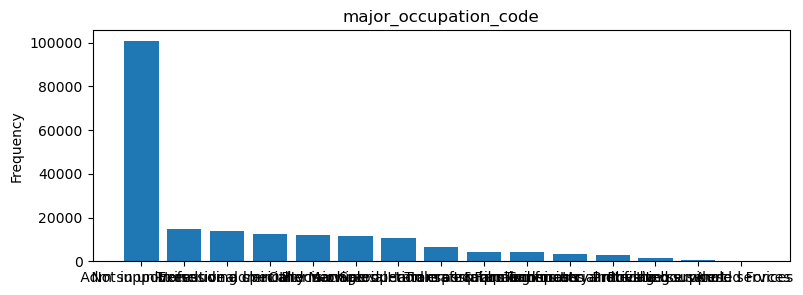

major_occupation_code: 
  Not in universe                          100684
 Adm support including clerical            14837
 Professional specialty                    13940
 Executive admin and managerial            12495
 Other service                             12099
 Sales                                     11783
 Precision production craft & repair       10518
 Machine operators assmblrs & inspctrs      6379
 Handlers equip cleaners etc                4127
 Transportation and material moving         4020
 Farming forestry and fishing               3146
 Technicians and related support            3018
 Protective services                        1661
 Private household services                  780
 Armed Forces                                 36
Name: major_occupation_code, dtype: int64


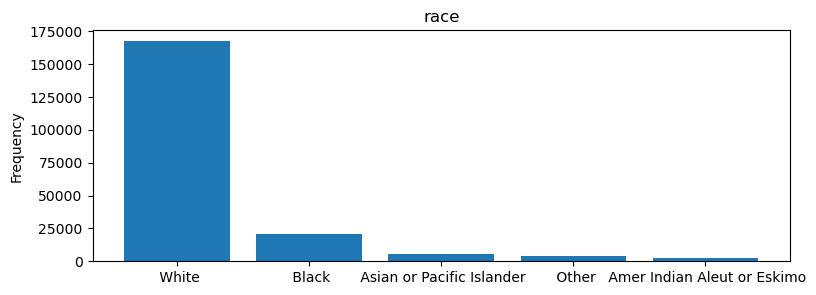

race: 
  White                          167365
 Black                           20415
 Asian or Pacific Islander        5835
 Other                            3657
 Amer Indian Aleut or Eskimo      2251
Name: race, dtype: int64


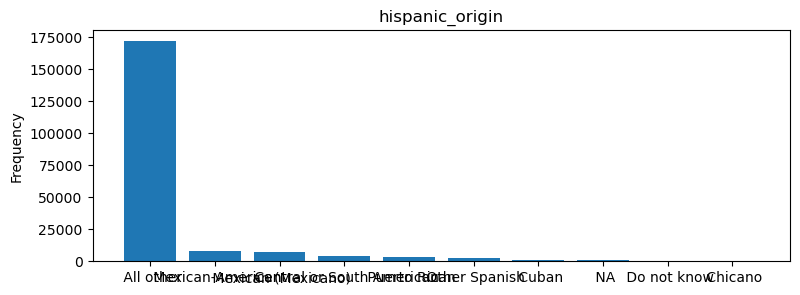

hispanic_origin: 
  All other                    171907
 Mexican-American               8079
 Mexican (Mexicano)             7234
 Central or South American      3895
 Puerto Rican                   3313
 Other Spanish                  2485
 Cuban                          1126
 NA                              874
 Do not know                     306
 Chicano                         304
Name: hispanic_origin, dtype: int64


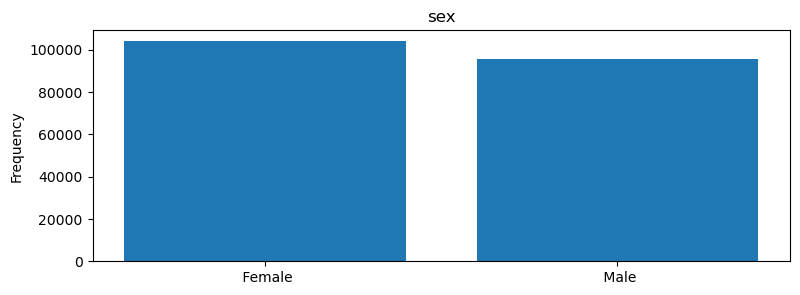

sex: 
  Female    103984
 Male       95539
Name: sex, dtype: int64


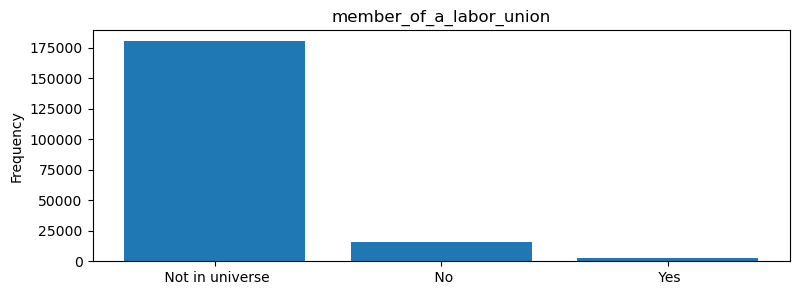

member_of_a_labor_union: 
  Not in universe    180459
 No                  16034
 Yes                  3030
Name: member_of_a_labor_union, dtype: int64


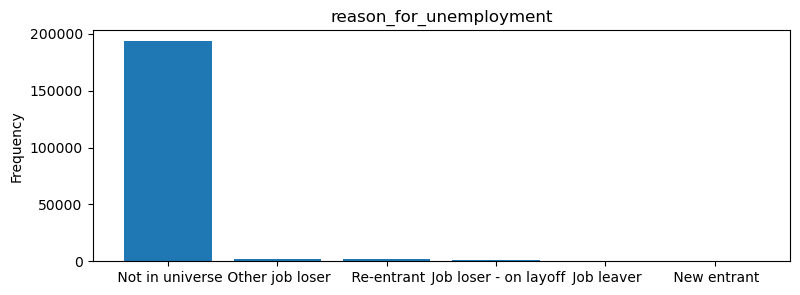

reason_for_unemployment: 
  Not in universe          193453
 Other job loser            2038
 Re-entrant                 2019
 Job loser - on layoff       976
 Job leaver                  598
 New entrant                 439
Name: reason_for_unemployment, dtype: int64


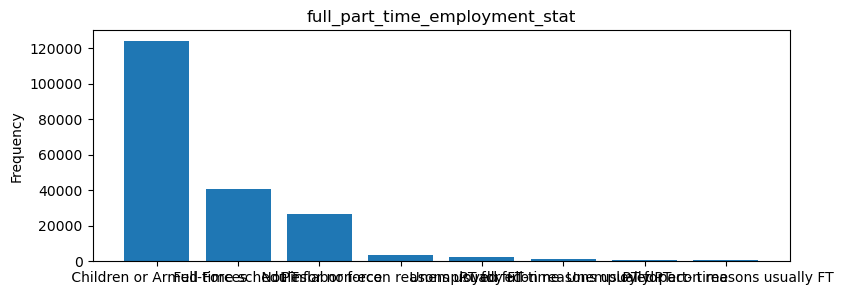

full_part_time_employment_stat: 
  Children or Armed Forces              123769
 Full-time schedules                    40736
 Not in labor force                     26808
 PT for non-econ reasons usually FT      3322
 Unemployed full-time                    2311
 PT for econ reasons usually PT          1209
 Unemployed part- time                    843
 PT for econ reasons usually FT           525
Name: full_part_time_employment_stat, dtype: int64


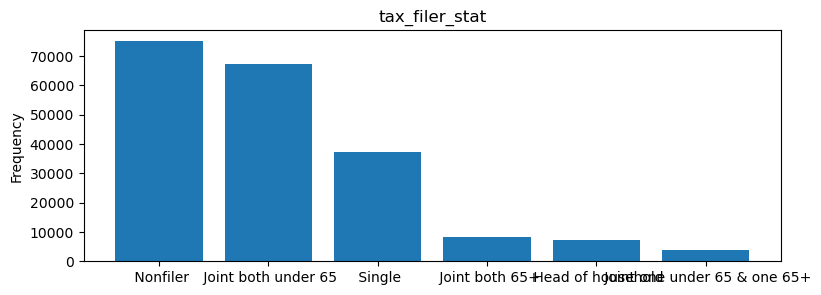

tax_filer_stat: 
  Nonfiler                        75094
 Joint both under 65             67383
 Single                          37421
 Joint both 65+                   8332
 Head of household                7426
 Joint one under 65 & one 65+     3867
Name: tax_filer_stat, dtype: int64


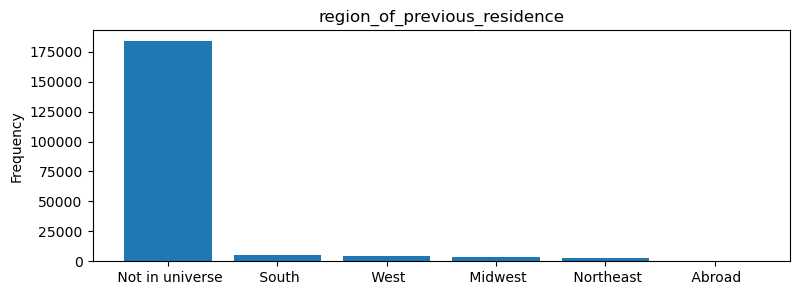

region_of_previous_residence: 
  Not in universe    183750
 South                4889
 West                 4074
 Midwest              3575
 Northeast            2705
 Abroad                530
Name: region_of_previous_residence, dtype: int64


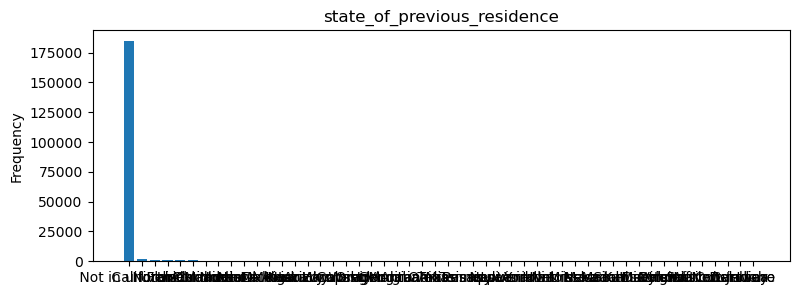

state_of_previous_residence: 
  Not in universe         184458
 California                1714
 Utah                      1063
 Florida                    849
 North Carolina             812
 Abroad                     671
 Oklahoma                   626
 Minnesota                  576
 Indiana                    533
 North Dakota               499
 New Mexico                 463
 Michigan                   441
 Alaska                     290
 Kentucky                   244
 Arizona                    243
 New Hampshire              242
 Wyoming                    241
 Colorado                   239
 Oregon                     236
 West Virginia              231
 Georgia                    227
 Montana                    226
 Alabama                    216
 Ohio                       211
 Texas                      209
 Arkansas                   205
 Mississippi                204
 Tennessee                  202
 Pennsylvania               199
 New York                   195
 Louisian

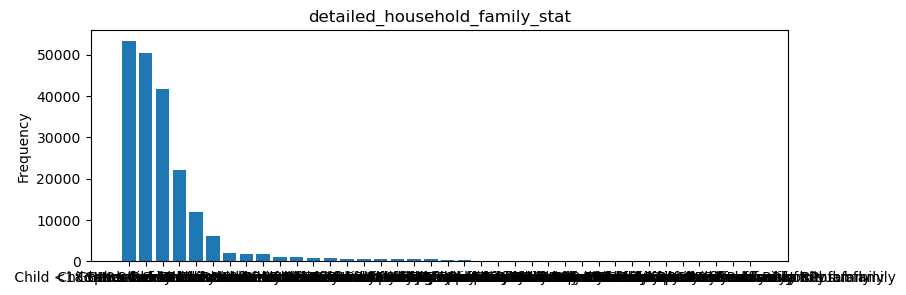

detailed_household_family_stat: 
  Householder                                        53248
 Child <18 never marr not in subfamily              50326
 Spouse of householder                              41695
 Nonfamily householder                              22213
 Child 18+ never marr Not in a subfamily            12030
 Secondary individual                                6122
 Other Rel 18+ ever marr not in subfamily            1956
 Grandchild <18 never marr child of subfamily RP     1868
 Other Rel 18+ never marr not in subfamily           1728
 Grandchild <18 never marr not in subfamily          1066
 Child 18+ ever marr Not in a subfamily              1013
 Child under 18 of RP of unrel subfamily              732
 RP of unrelated subfamily                            685
 Child 18+ ever marr RP of subfamily                  671
 Other Rel <18 never marr child of subfamily RP       656
 Other Rel 18+ ever marr RP of subfamily              656
 Other Rel 18+ spouse of subfamily RP 

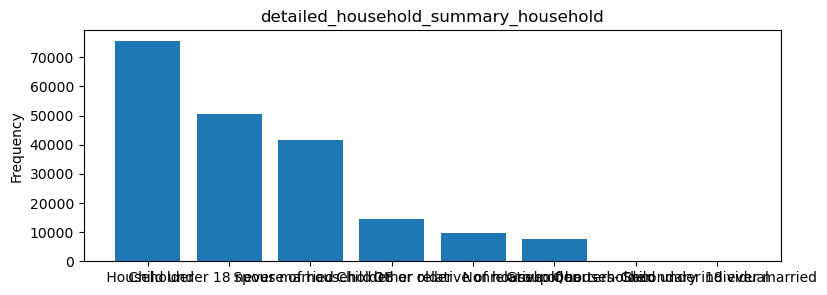

detailed_household_summary_household: 
  Householder                             75475
 Child under 18 never married            50426
 Spouse of householder                   41709
 Child 18 or older                       14430
 Other relative of householder            9703
 Nonrelative of householder               7601
 Group Quarters- Secondary individual      132
 Child under 18 ever married                47
Name: detailed_household_summary_household, dtype: int64


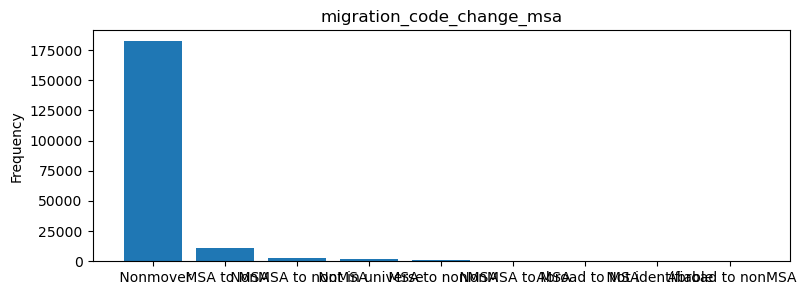

migration_code_change_msa: 
  Nonmover            182234
 MSA to MSA           10601
 NonMSA to nonMSA      2811
 Not in universe       1516
 MSA to nonMSA          790
 NonMSA to MSA          615
 Abroad to MSA          453
 Not identifiable       430
 Abroad to nonMSA        73
Name: migration_code_change_msa, dtype: int64


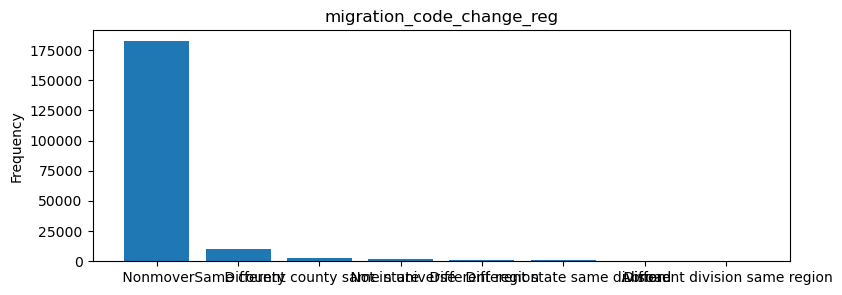

migration_code_change_reg: 
  Nonmover                          182234
 Same county                         9812
 Different county same state         2797
 Not in universe                     1516
 Different region                    1178
 Different state same division        991
 Abroad                               530
 Different division same region       465
Name: migration_code_change_reg, dtype: int64


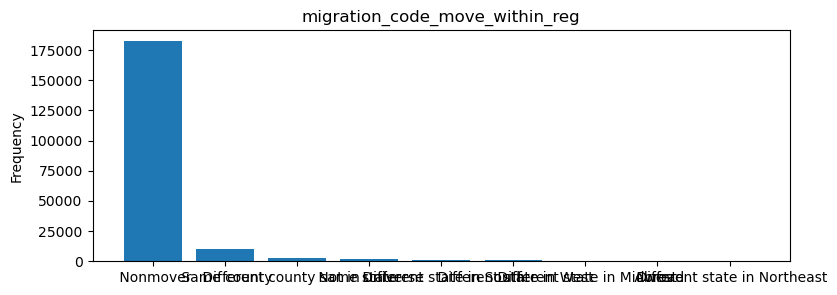

migration_code_move_within_reg: 
  Nonmover                        182234
 Same county                       9812
 Different county same state       2797
 Not in universe                   1516
 Different state in South           973
 Different state in West            679
 Different state in Midwest         551
 Abroad                             530
 Different state in Northeast       431
Name: migration_code_move_within_reg, dtype: int64


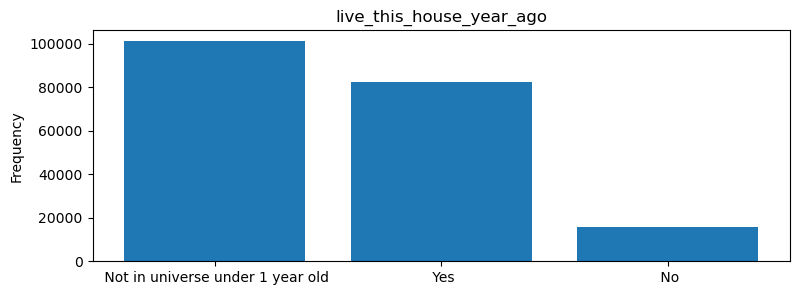

live_this_house_year_ago: 
  Not in universe under 1 year old    101212
 Yes                                  82538
 No                                   15773
Name: live_this_house_year_ago, dtype: int64


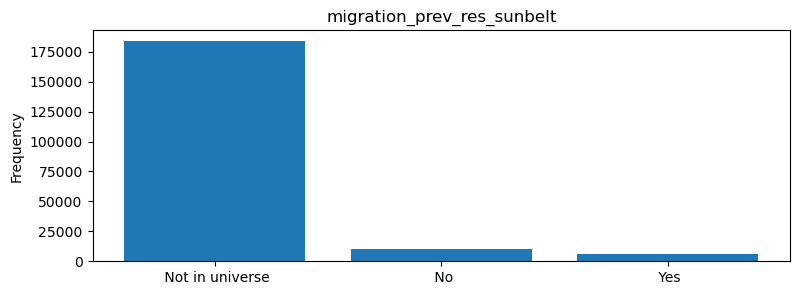

migration_prev_res_sunbelt: 
  Not in universe    183750
 No                   9987
 Yes                  5786
Name: migration_prev_res_sunbelt, dtype: int64


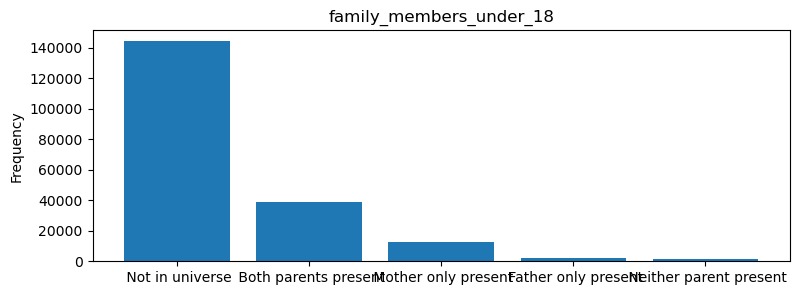

family_members_under_18: 
  Not in universe           144232
 Both parents present       38983
 Mother only present        12772
 Father only present         1883
 Neither parent present      1653
Name: family_members_under_18, dtype: int64


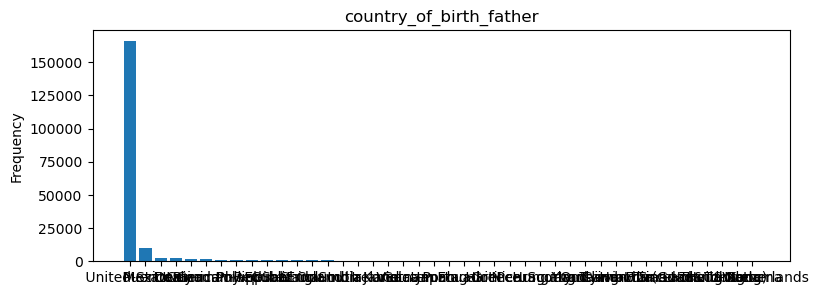

country_of_birth_father: 
  United-States                   165876
 Mexico                           10008
 Puerto-Rico                       2680
 Italy                             2212
 Canada                            1380
 Germany                           1356
 Dominican-Republic                1290
 Poland                            1212
 Philippines                       1154
 Cuba                              1125
 El-Salvador                        982
 China                              856
 England                            793
 Columbia                           614
 India                              580
 South Korea                        530
 Ireland                            508
 Jamaica                            463
 Vietnam                            457
 Guatemala                          445
 Japan                              392
 Portugal                           388
 Ecuador                            379
 Haiti                              351
 Greece      

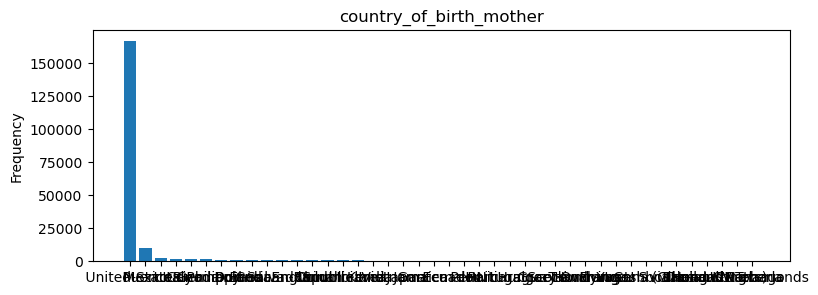

country_of_birth_mother: 
  United-States                   166598
 Mexico                            9781
 Puerto-Rico                       2473
 Italy                             1844
 Canada                            1451
 Germany                           1382
 Philippines                       1231
 Poland                            1110
 Cuba                              1108
 El-Salvador                       1108
 Dominican-Republic                1103
 England                            903
 China                              760
 Columbia                           612
 South Korea                        609
 Ireland                            599
 India                              581
 Vietnam                            473
 Japan                              469
 Jamaica                            453
 Guatemala                          444
 Ecuador                            375
 Peru                               355
 Haiti                              353
 Portugal    

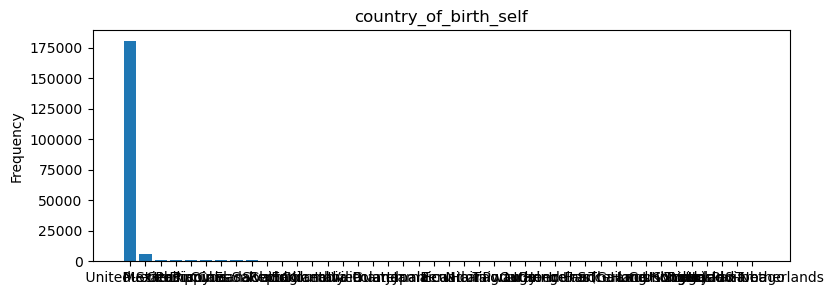

country_of_birth_self: 
  United-States                   180382
 Mexico                            5767
 Puerto-Rico                       1400
 Germany                            851
 Philippines                        845
 Cuba                               837
 Canada                             700
 Dominican-Republic                 690
 El-Salvador                        689
 China                              478
 South Korea                        471
 England                            457
 Columbia                           434
 Italy                              419
 India                              408
 Vietnam                            391
 Poland                             381
 Guatemala                          344
 Japan                              339
 Jamaica                            320
 Peru                               268
 Ecuador                            258
 Haiti                              228
 Nicaragua                          218
 Taiwan        

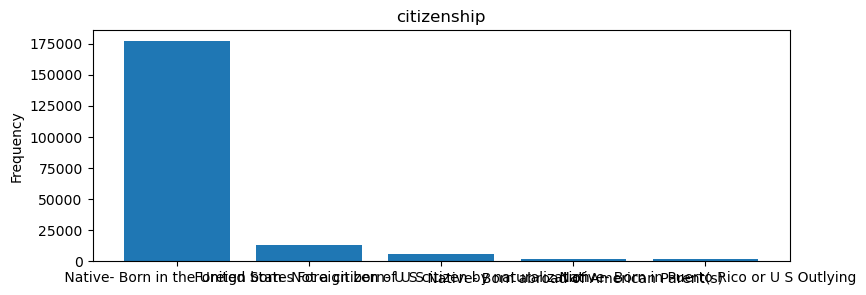

citizenship: 
  Native- Born in the United States              176992
 Foreign born- Not a citizen of U S              13401
 Foreign born- U S citizen by naturalization      5855
 Native- Born abroad of American Parent(s)        1756
 Native- Born in Puerto Rico or U S Outlying      1519
Name: citizenship, dtype: int64


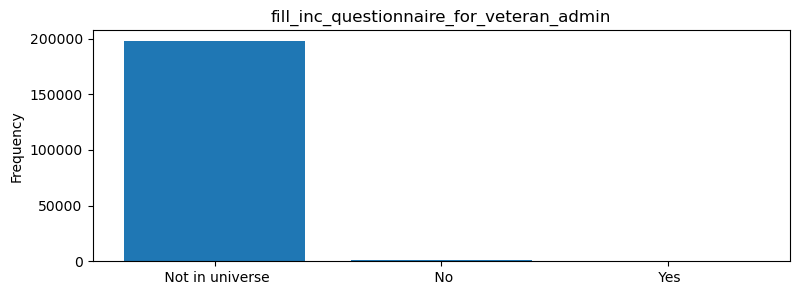

fill_inc_questionnaire_for_veteran_admin: 
  Not in universe    197539
 No                   1593
 Yes                   391
Name: fill_inc_questionnaire_for_veteran_admin, dtype: int64


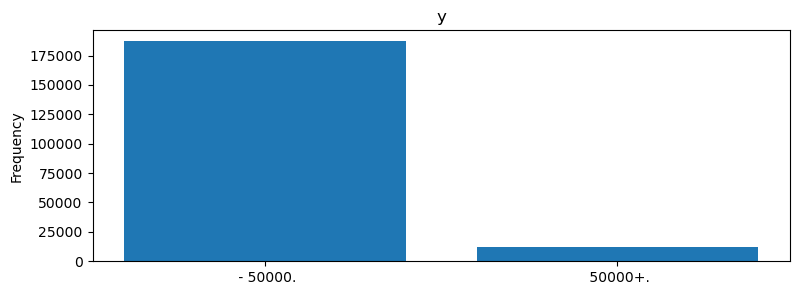

y: 
  - 50000.    187141
 50000+.      12382
Name: y, dtype: int64


In [201]:
variable=['class_of_worker', 'education',  'enroll_in_edu_inst_last_wk', 'marital_stat', 'major_industry_code',
       'major_occupation_code', 'race', 'hispanic_origin', 'sex','member_of_a_labor_union', 'reason_for_unemployment',
       'full_part_time_employment_stat','tax_filer_stat',  'region_of_previous_residence', 'state_of_previous_residence',
       'detailed_household_family_stat', 'detailed_household_summary_household', 'migration_code_change_msa', 'migration_code_change_reg',
       'migration_code_move_within_reg', 'live_this_house_year_ago',
       'migration_prev_res_sunbelt','family_members_under_18', 'country_of_birth_father',
       'country_of_birth_mother', 'country_of_birth_self', 'citizenship',
       'fill_inc_questionnaire_for_veteran_admin', 'y']
for each in variable:
    bar_plot(each)

In [202]:
def plot_hist(variable):
    plt.figure(figsize = (9,3))
    plt.hist(train[variable], bins = 50)
    plt.xlabel(variable)
    plt.ylabel("Frequency")
    plt.title("{} distribution with hist".format(variable))
    plt.show()

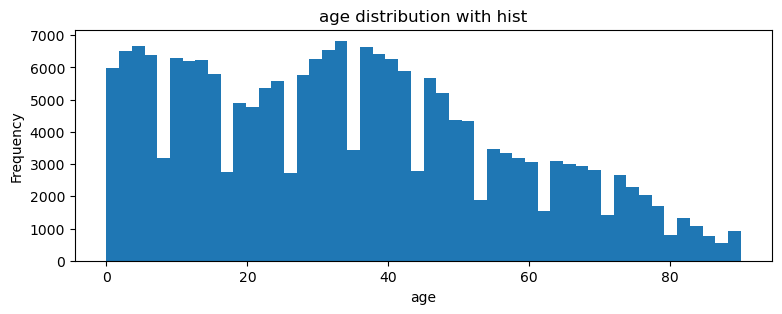

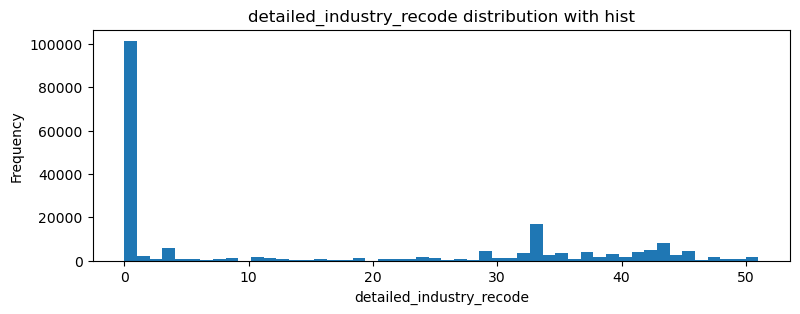

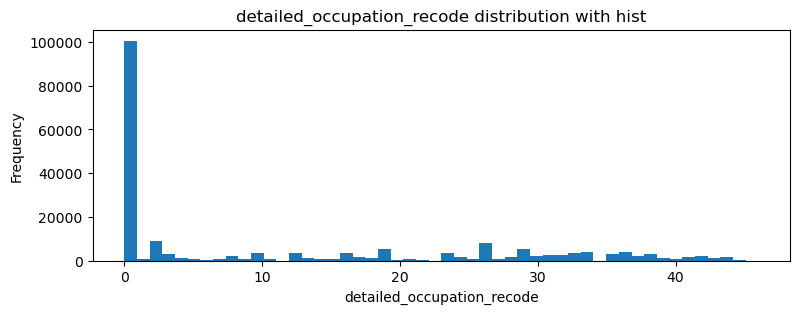

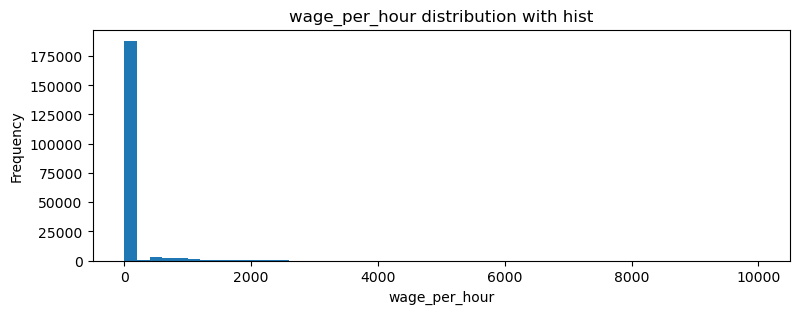

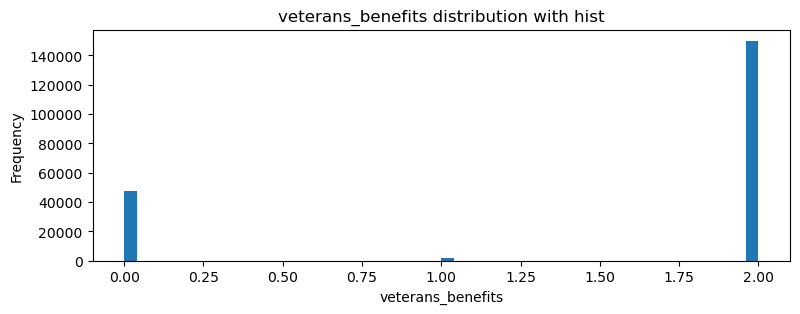

...

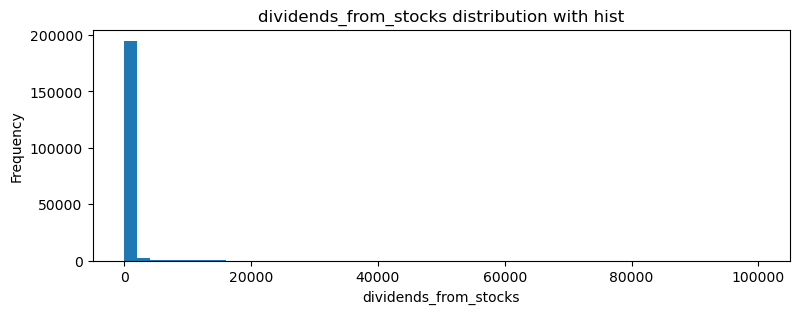

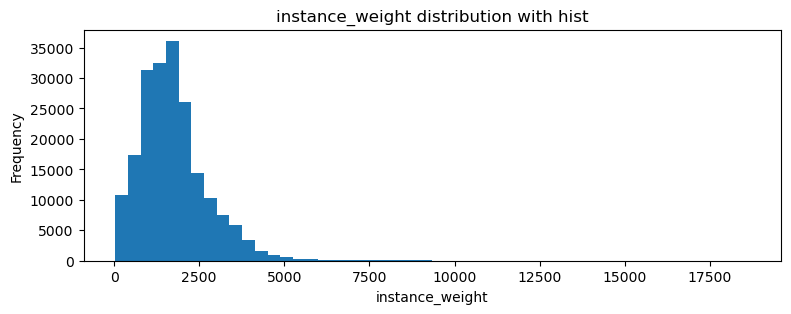

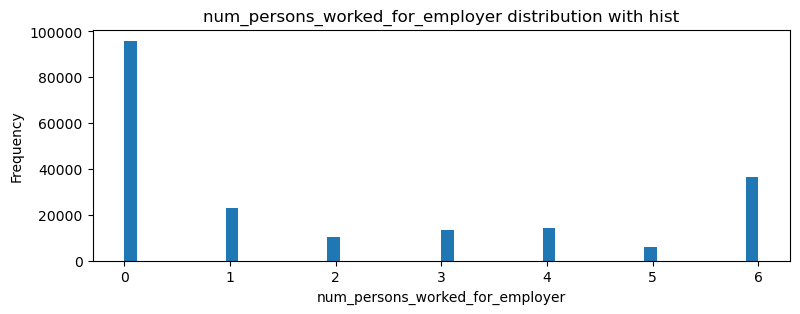

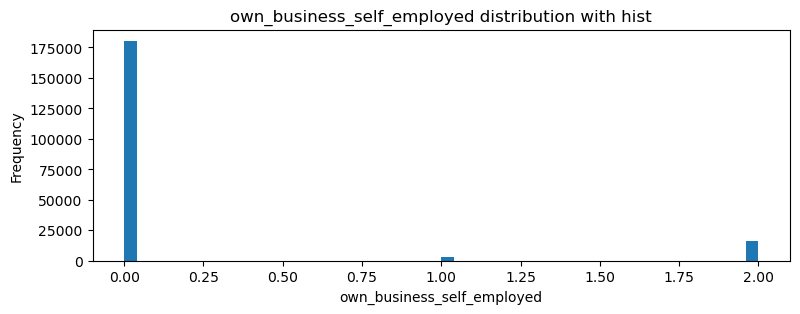

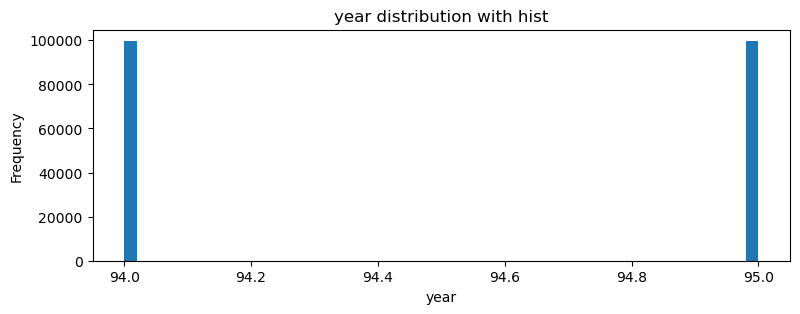

In [203]:
num_var=['age','detailed_industry_recode','detailed_occupation_recode','wage_per_hour','veterans_benefits',
       'week_worked_year','wage_per_hour','capital_gains', 'capital losses',
       'dividends_from_stocks','instance_weight','num_persons_worked_for_employer','own_business_self_employed','year']
for n in num_var:
    plot_hist(n)

## Data Preprocessing for Simple Data Analysis
At this stage, we will undergo some data preprocessing to simply analyze our data and train it in machine learning algorithms.
First of all, let's remove the unnecessary columns from our data for our machine learning algorithm.

In [21]:
train.drop(['capital_gains', 'capital losses',
       'dividends_from_stocks','instance_weight'], axis=1, inplace=True)

In [22]:
income=train['y'][0]

In [23]:
income

' - 50000.'

In [24]:
### Convert the y column into binary data

In [25]:
train.y = [0 if x == income else 1 for x in train.y]

In [26]:
train.head(2)

,age,class_of_worker,detailed_industry_recode,detailed_occupation_recode,education,wage_per_hour,enroll_in_edu_inst_last_wk,marital_stat,major_industry_code,major_occupation_code,...,country_of_birth_father,country_of_birth_mother,country_of_birth_self,citizenship,own_business_self_employed,fill_inc_questionnaire_for_veteran_admin,veterans_benefits,week_worked_year,year,y
0,73,Not in universe,0,0,High school graduate,0,Not in universe,Widowed,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,0,95,0
1,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,0


In [27]:
#### Check the conversion has happen on the column 'y'

In [28]:
train['y'].max()

1

In [29]:
train['y'].min()

0

## Simple Data Analysis with Visualization Tools
At this stage we will look at the relationship between the matploblib library and some important variables and one's y.
* class of worker vs y
* education vs y
* sex vs y
* race vs y
* marital status vs y
* tax filer status vs y
* own business self employed vs y
* citizenship vs y

                   class_of_worker         y
5       Self-employed-incorporated  0.347320
0               Federal government  0.204103
6   Self-employed-not incorporated  0.129070
7                 State government  0.114739
1                 Local government  0.108813
4                          Private  0.101655
3                  Not in universe  0.009018
8                      Without pay  0.006061
2                     Never worked  0.004556


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3723: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


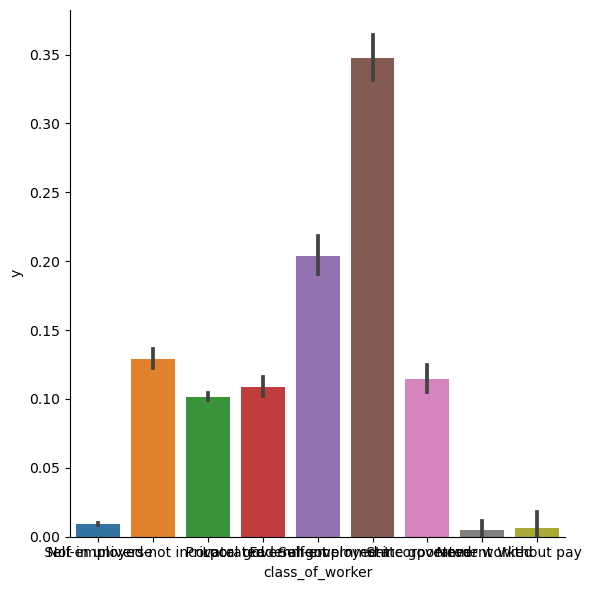

In [212]:
print(train[["class_of_worker","y"]].groupby(["class_of_worker"], as_index = False).mean().sort_values(by="y",ascending = False))
g = sns.factorplot(x = "class_of_worker", y = "y", data = train, kind = "bar", size = 6)
g.set_ylabels("y")
plt.show()

                                  education         y
15   Prof school degree (MD DDS DVM LLB JD)  0.540435
11                Doctorate degree(PhD EdD)  0.520190
14   Masters degree(MA MS MEng MEd MSW MBA)  0.311573
9                Bachelors degree(BA AB BS)  0.197080
7        Associates degree-academic program  0.094430
8       Associates degree-occup /vocational  0.077081
16               Some college but no degree  0.064234
12                     High school graduate  0.038817
2                     12th grade no diploma  0.015992
1                                11th grade  0.010180
5                         7th and 8th grade  0.008992
0                                10th grade  0.008204
3                  1st 2nd 3rd or 4th grade  0.007226
4                          5th or 6th grade  0.006713
6                                 9th grade  0.006100
13                      Less than 1st grade  0.001221
10                                 Children  0.000000


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3723: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


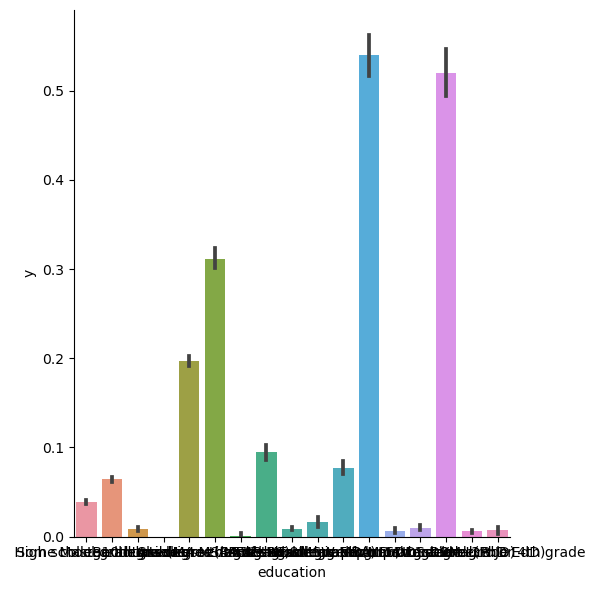

In [213]:
print(train[["education","y"]].groupby(["education"], as_index = False).mean().sort_values(by="y",ascending = False))
g = sns.factorplot(x = "education", y = "y", data = train, kind = "bar", size = 6)
g.set_ylabels("y")
plt.show()

       sex         y
1     Male  0.101728
0   Female  0.025610


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3723: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


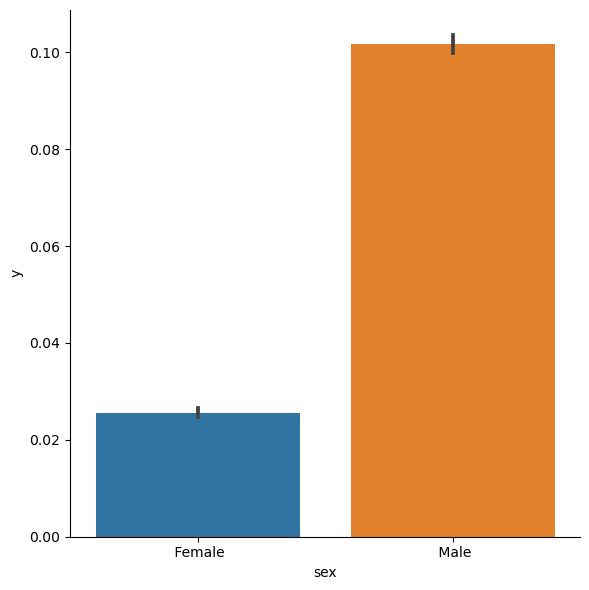

In [214]:
print(train[["sex","y"]].groupby(["sex"], as_index = False).mean().sort_values(by="y",ascending = False))

g = sns.factorplot(x = "sex", y = "y", data = train, kind = "bar", size = 6)
g.set_ylabels("y")
plt.show()

                           race         y
1     Asian or Pacific Islander  0.073693
4                         White  0.067350
2                         Black  0.026451
3                         Other  0.024884
0   Amer Indian Aleut or Eskimo  0.021768


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3723: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


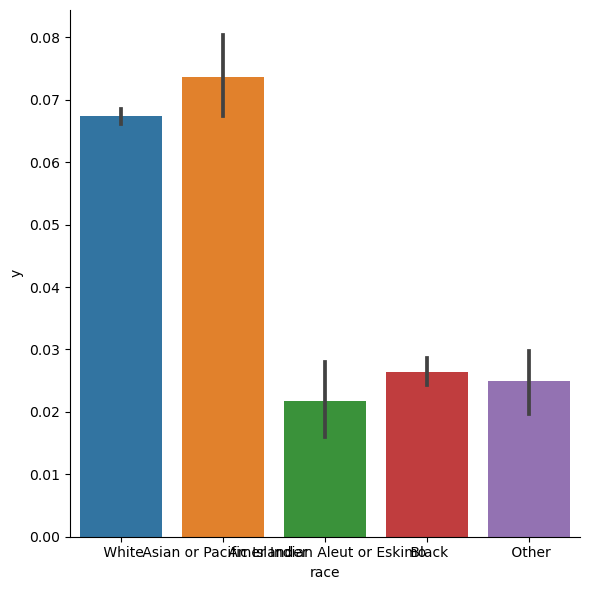

In [215]:
print(train[["race","y"]].groupby(["race"], as_index = False).mean().sort_values(by="y",ascending = False))

g = sns.factorplot(x = "race", y = "y", data = train, kind = "bar", size = 6)
g.set_ylabels("y")
plt.show()

                       marital_stat         y
2   Married-civilian spouse present  0.113984
0                          Divorced  0.083871
3             Married-spouse absent  0.063241
5                         Separated  0.045665
6                           Widowed  0.031540
1        Married-A F spouse present  0.022556
4                     Never married  0.012916


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3723: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


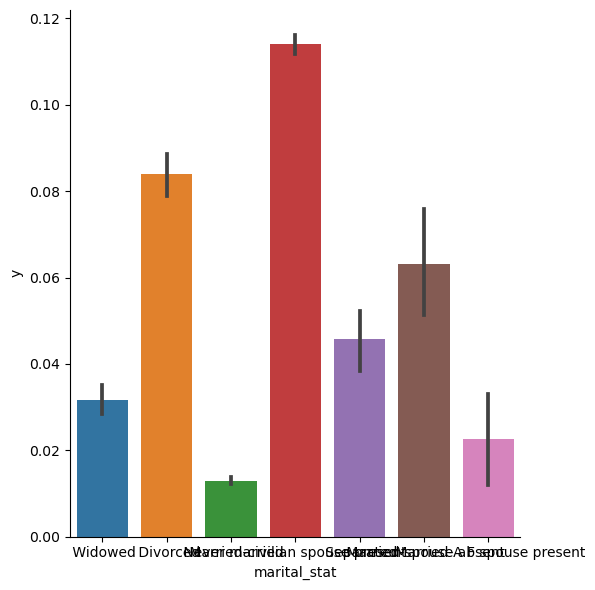

In [216]:
print(train[["marital_stat","y"]].groupby(["marital_stat"], as_index = False).mean().sort_values(by="y",ascending = False))

g = sns.factorplot(x = "marital_stat", y = "y", data = train, kind = "bar", size = 6)
g.set_ylabels("y")
plt.show()

                  tax_filer_stat         y
2            Joint both under 65  0.131383
3   Joint one under 65 & one 65+  0.077838
5                         Single  0.061329
0              Head of household  0.060329
1                 Joint both 65+  0.054009
4                       Nonfiler  0.000466


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3723: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


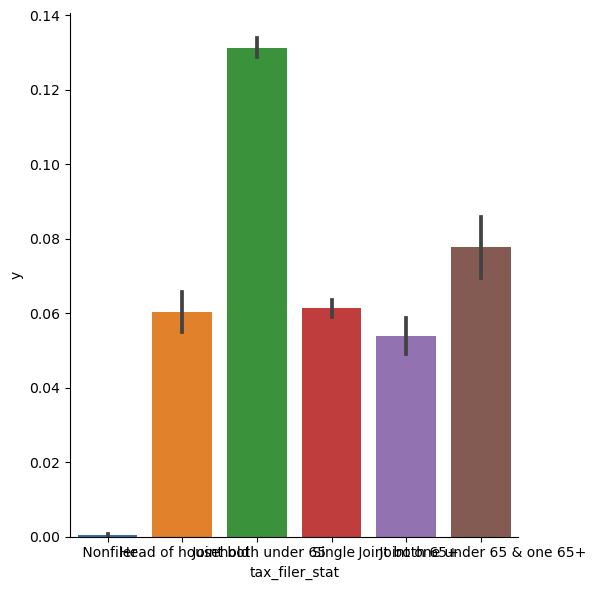

In [217]:
print(train[["tax_filer_stat","y"]].groupby(["tax_filer_stat"], as_index = False).mean().sort_values(by="y",ascending = False))

g = sns.factorplot(x = "tax_filer_stat", y = "y", data = train, kind = "bar", size = 6)
g.set_ylabels("y")
plt.show()

   own_business_self_employed         y
1                           1  0.225723
2                           2  0.081780
0                           0  0.057851


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3723: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


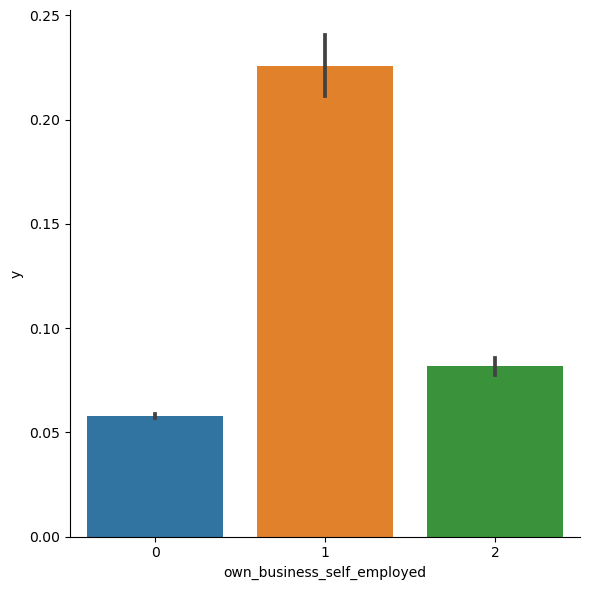

In [218]:
print(train[["own_business_self_employed","y"]].groupby(["own_business_self_employed"], as_index = False).mean().sort_values(by="y",ascending = False))

g = sns.factorplot(x = "own_business_self_employed", y = "y", data = train, kind = "bar", size = 6)
g.set_ylabels("y")
plt.show()

                                    citizenship         y
1   Foreign born- U S citizen by naturalization  0.099061
2     Native- Born abroad of American Parent(s)  0.072893
4             Native- Born in the United States  0.062992
0           Foreign born- Not a citizen of U S   0.036714
3   Native- Born in Puerto Rico or U S Outlying  0.021725


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3717: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\seaborn\categorical.py:3723: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


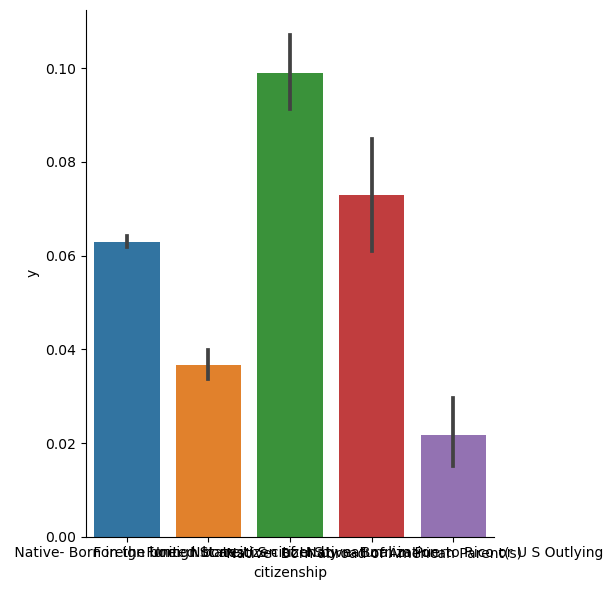

In [219]:
print(train[["citizenship","y"]].groupby(["citizenship"], as_index = False).mean().sort_values(by="y",ascending = False))

g = sns.factorplot(x = "citizenship", y = "y", data = train, kind = "bar", size = 6)
g.set_ylabels("y")
plt.show()

In [ ]:
### Convert the categorical variables to dummy variable

In [30]:
train = pd.get_dummies(train,columns=['class_of_worker', 'education',  'enroll_in_edu_inst_last_wk', 'marital_stat', 'major_industry_code',
       'major_occupation_code', 'race', 'hispanic_origin', 'sex','member_of_a_labor_union', 'reason_for_unemployment',
       'full_part_time_employment_stat','tax_filer_stat', 'detailed_household_family_stat', 'detailed_household_summary_household', 'migration_code_change_msa', 'migration_code_change_reg',
       'migration_code_move_within_reg', 'live_this_house_year_ago',
       'migration_prev_res_sunbelt','family_members_under_18', 'country_of_birth_father',
       'country_of_birth_mother', 'country_of_birth_self', 'citizenship',
       'fill_inc_questionnaire_for_veteran_admin'])

Remove the categorical column __'region_of_previous_residence','state_of_previous_residence'__ since the data has more 
__'Not in Universe'__ value

In [31]:
#### Model Creation and Model Assesment

In [56]:
x = train.drop(["y",'region_of_previous_residence','state_of_previous_residence','year'],axis=1)
y = train.y.values

In [33]:
#### read the test data

In [34]:
test=pd.read_csv('census_income_test.csv',names=['0', '1', '2','3','4','5','6','7','8','9','10','11',
                                                     '12','13','14','15','16','17','18','19','20','21','22','23','24','25','26'
                                                    ,'27','28','29','30','31','32','33','34','35','36','37','38','39','40','41'])

In [35]:
test.head(2)

,0,1,2,3,4,5,6,7,8,9,...,32,33,34,35,36,37,38,39,40,41
0,38,Private,6,36,1st 2nd 3rd or 4th grade,0,Not in universe,Married-civilian spouse present,Manufacturing-durable goods,Machine operators assmblrs & inspctrs,...,Mexico,Mexico,Mexico,Foreign born- Not a citizen of U S,0,Not in universe,2,12,95,- 50000.
1,44,Self-employed-not incorporated,37,12,Associates degree-occup /vocational,0,Not in universe,Married-civilian spouse present,Business and repair services,Professional specialty,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,26,95,- 50000.


In [36]:
#### Follow the column name changes that we did in train data

In [37]:
rename=new_name(col='40',list_of_value=year,new_col='year',df=test)

In [38]:
test = test.rename(columns={'40':rename,'0':'age','41':'y'})

In [39]:
test = test.rename(columns={'12':'sex','11':'hispanic_origin','10':'race','9':'major_occupation_code',
                              '8':'major_industry_code','7':'marital_stat',
                              '4':'education','1':'class_of_worker','6':'enroll_in_edu_inst_last_wk'
                             ,'13':'member_of_a_labor_union',
                              '14':'reason_for_unemployment','15':'full_part_time_employment_stat',
                             '19':'tax_filer_stat','20':'region_of_previous_residence','21':'state_of_previous_residence',
                              '22':'detailed_household_family_stat','23':'detailed_household_summary_household',
                              '25':'migration_code_change_msa',
                              '26':'migration_code_change_reg','27':'migration_code_move_within_reg'
                             ,'28':'live_this_house_year_ago','29':'migration_prev_res_sunbelt',
                            '31':'family_members_under_18',
                             '32':'country_of_birth_father','33':'country_of_birth_mother','34':'country_of_birth_self',
                             '35':'citizenship','36':'own_business_self_employed','37':'fill_inc_questionnaire_for_veteran_admin'
                             ,'38':'veterans_benefits'})

In [40]:
test = test.rename(columns={'39':'week_worked_year','2':'detailed_industry_recode','3':'detailed_occupation_recode',
                              '5':'wage_per_hour',
                              '16':'capital_gains','17':'capital losses',
                              '18':'dividends_from_stocks','24':'instance_weight','30':'num_persons_worked_for_employer'
                             })

In [41]:
### Check if any '?' data is present in test data

In [42]:
test[test == null] = np.nan

In [43]:
test.isna().sum() / test.shape[0] * 100

age                                          0.000000
class_of_worker                              0.000000
detailed_industry_recode                     0.000000
detailed_occupation_recode                   0.000000
education                                    0.000000
wage_per_hour                                0.000000
enroll_in_edu_inst_last_wk                   0.000000
marital_stat                                 0.000000
major_industry_code                          0.000000
major_occupation_code                        0.000000
race                                         0.000000
hispanic_origin                              0.000000
sex                                          0.000000
member_of_a_labor_union                      0.000000
reason_for_unemployment                      0.000000
full_part_time_employment_stat               0.000000
capital_gains                                0.000000
capital losses                               0.000000
dividends_from_stocks       

In [44]:
# We write the columns with missing data in a list.
ctgrs = ["state_of_previous_residence","migration_code_change_msa","migration_code_change_reg","migration_code_move_within_reg"
        ,"migration_prev_res_sunbelt","country_of_birth_father","country_of_birth_mother","country_of_birth_self"]

# We fill these missing values with the for loop

for x in ctgrs:
    test[x].fillna(test[x].mode()[0], inplace=True)

In [45]:
### Remove the columns that is not needed for model creation in test data

In [46]:
test.drop(['capital_gains', 'capital losses',
       'dividends_from_stocks','instance_weight','state_of_previous_residence'], axis=1, inplace=True)

In [59]:
train.drop(['state_of_previous_residence','region_of_previous_residence'], axis=1, inplace=True)

In [60]:
train.head(2)

,age,detailed_industry_recode,detailed_occupation_recode,wage_per_hour,num_persons_worked_for_employer,own_business_self_employed,veterans_benefits,week_worked_year,year,y,...,country_of_birth_self_ Vietnam,country_of_birth_self_ Yugoslavia,citizenship_ Foreign born- Not a citizen of U S,citizenship_ Foreign born- U S citizen by naturalization,citizenship_ Native- Born abroad of American Parent(s),citizenship_ Native- Born in Puerto Rico or U S Outlying,citizenship_ Native- Born in the United States,fill_inc_questionnaire_for_veteran_admin_ No,fill_inc_questionnaire_for_veteran_admin_ Not in universe,fill_inc_questionnaire_for_veteran_admin_ Yes
0,73,0,0,0,0,0,2,0,95,0,...,0,0,0,0,0,0,1,0,1,0
1,58,4,34,0,1,0,2,52,94,0,...,0,0,0,0,0,0,1,0,1,0


In [47]:
test.drop(['region_of_previous_residence'], axis=1, inplace=True)

In [48]:
### Convert the y column to binary data

In [49]:
test.y = [0 if x == income else 1 for x in test.y]

In [50]:
test = pd.get_dummies(test,columns=['class_of_worker', 'education',  'enroll_in_edu_inst_last_wk', 'marital_stat', 'major_industry_code',
       'major_occupation_code', 'race', 'hispanic_origin', 'sex','member_of_a_labor_union', 'reason_for_unemployment',
       'full_part_time_employment_stat','tax_filer_stat', 'detailed_household_family_stat', 'detailed_household_summary_household', 'migration_code_change_msa', 'migration_code_change_reg',
       'migration_code_move_within_reg', 'live_this_house_year_ago',
       'migration_prev_res_sunbelt','family_members_under_18', 'country_of_birth_father',
       'country_of_birth_mother', 'country_of_birth_self', 'citizenship',
       'fill_inc_questionnaire_for_veteran_admin'])

In [51]:
test.head()

,age,detailed_industry_recode,detailed_occupation_recode,wage_per_hour,num_persons_worked_for_employer,own_business_self_employed,veterans_benefits,week_worked_year,year,y,...,country_of_birth_self_ Vietnam,country_of_birth_self_ Yugoslavia,citizenship_ Foreign born- Not a citizen of U S,citizenship_ Foreign born- U S citizen by naturalization,citizenship_ Native- Born abroad of American Parent(s),citizenship_ Native- Born in Puerto Rico or U S Outlying,citizenship_ Native- Born in the United States,fill_inc_questionnaire_for_veteran_admin_ No,fill_inc_questionnaire_for_veteran_admin_ Not in universe,fill_inc_questionnaire_for_veteran_admin_ Yes
0,38,6,36,0,4,0,2,12,95,0,...,0,0,1,0,0,0,0,0,1,0
1,44,37,12,0,1,0,2,26,95,0,...,0,0,0,0,0,0,1,0,1,0
2,2,0,0,0,0,0,0,0,95,0,...,0,0,0,0,0,0,1,0,1,0
3,35,29,3,0,5,2,2,52,94,0,...,0,0,0,0,0,0,1,0,1,0
4,49,4,34,0,4,0,2,50,95,0,...,0,0,0,0,0,0,1,0,1,0


In [61]:
### We can see train data has 342 columns and test has 341 columns which create a problem in creating model

In [62]:
train.columns.difference(test.columns).tolist()

['detailed_household_family_stat_ Grandchild <18 ever marr not in subfamily']

In [63]:
test['detailed_household_family_stat_ Grandchild <18 ever marr not in subfamily']=0

In [55]:
x_test = test.drop(["y",'year'],axis=1)
y_test = test.y.values

In [263]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

log = LogisticRegression()

log.fit(x,y)

pred = log.predict(x_test)

#Modelimiz ne kadar başarılı görelim.
print("Logistic Regression Accuracy : ",accuracy_score(y_test,pred))

C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)


Logistic Regression Accuracy :  0.9445981435817246


In [264]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier()

dt.fit(x,y)

print("Decision Tree Accuracy ", dt.score(x_test,y_test))

C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)


Decision Tree Accuracy  0.8974659690062349


In [265]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=200)

rf.fit(x,y)

print("Random Forest Score ",rf.score(x_test,y_test))

C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)


Random Forest Score  0.941430604839518


In [266]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=3)

knn.fit(x,y)

pred_for_knn = knn.predict(x_test)

print("KNN score: ",knn.score(x_test, y_test))

C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

KNN score:  0.9386439726549187


In [50]:
from sklearn.neighbors import KNeighborsClassifier


In [56]:
score_list = []

for i in range(1,20):
    knn2 = KNeighborsClassifier(n_neighbors=i)
    knn2.fit(x,y)
    score_list.append(knn2.score(x_test,y_test))
    print("k neighbour",i," score",knn2.score(x_test,y_test))


plt.plot(range(1,20),score_list)
plt.xticks(range(1,20))
plt.xlabel("k values")
plt.ylabel("score")
plt.legend()
plt.grid()
plt.show()

C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 1  score 0.9262645095326878


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 2  score 0.9408492211463283


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 3  score 0.9386439726549187


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 4  score 0.9430544696377379


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 5  score 0.9422625849521862


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 6  score 0.9439165213207433


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 7  score 0.9430243980674005


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 8  score 0.9441771415970008


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 9  score 0.9433451614843327


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 10  score 0.9443675948758045


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 11  score 0.944116998456326


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 12  score 0.9447184298630741


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 13  score 0.9441971893105592


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 14  score 0.9446983821495158


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 15  score 0.9445179527274914


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 16  score 0.9447184298630741


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 17  score 0.9448186684308655


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 18  score 0.9447685491469698


C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\Sahaana Venkat\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed 

k neighbour 19  score 0.9449590024257734


NameError: name 'plt' is not defined

In [ ]:
## To see indept performance of the model we can use the confusion matrix to finalize the model